In [ ]:
pip install librosa matplotlib IPython pedalboard noisereduce

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 55.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 90.1 MB/s eta 0:00:00


In [ ]:
import librosa as librosa
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
%matplotlib inline
import librosa.display
import IPython
from IPython.display import Audio

# # import librosa
from librosa import display
# # import numpy as np
import IPython.display as ipd
# import matplotlib as plt
import soundfile as sf
import pedalboard as pdb
import noisereduce as nr
from pedalboard import Pedalboard, Compressor, Gain

sample rate: no of data samples per second sr:32000
load it into a vector  y ans plot it wrt sample rate(time)

<ipython-input-85-c4863d25046f>:2: FutureWarning: waveshow() keyword argument 'x_axis' has been renamed to 'axis' in version 0.10.0.
	This alias will be removed in version 1.0.
  librosa.display.waveshow(y, sr= sr, x_axis='s')


The sampled audio is returned as a numpy array (time series) and has  (866848,)  number of samples
The 10 randomly picked consequitive samples of the audio are:  [ 7.8333133e-14 -2.2583562e-14  1.0127444e-13 -6.2493020e-14
 -6.4999894e-15 -3.1081797e-13 -3.6617064e-13 -2.7851492e-13
 -3.9672085e-13 -2.9083363e-13]


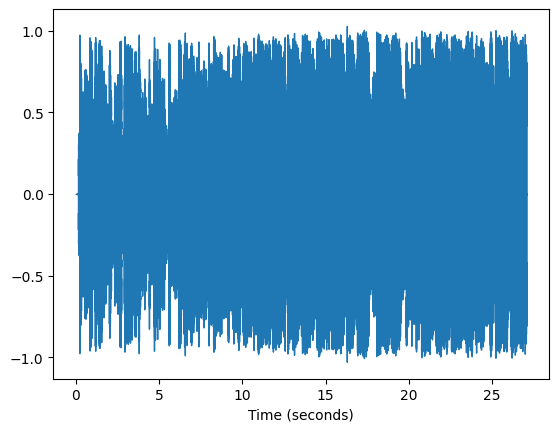

In [ ]:
y, sr = librosa.load('/content/untilifoundyousurge.mp3', sr=32000)
librosa.display.waveshow(y, sr= sr, x_axis='s')
print("The sampled audio is returned as a numpy array (time series) and has ", y.shape, " number of samples")
print("The 10 randomly picked consequitive samples of the audio are: ", y[3000:3010])

time domain waveform

In [ ]:
Audio('/content/untilifoundyousurge.mp3')

In [ ]:
# Size of the Fast Fourier Transform (FFT), which will also be used as the window length
n_fft=1024

# Step or stride between windows. If the step is smaller than the window length, the windows will overlap
hop_length=320

# Specify the window type for FFT/STFT
window_type ='hann'

# Calculate the spectrogram as the square of the complex magnitude of the STFT
spectrogram_librosa = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length, win_length=n_fft, window=window_type)) ** 2

print("The shape of spectrogram_librosa is: ", spectrogram_librosa.shape)
print("The size of the spectrogram is ([(frame_size/2) + 1 x number of frames])")
print("The frame size that we have specified is the number of samples to consider for the STFT. In our case, it is equal to the n_fft",n_fft, " samples")
print("The number of frames depends on the total length of the sampled signal, the number of samples in each frame and the hop length.")

The shape of spectrogram_librosa is:  (513, 3083)
The size of the spectrogram is ([(frame_size/2) + 1 x number of frames])
The frame size that we have specified is the number of samples to consider for the STFT. In our case, it is equal to the n_fft 1024  samples
The number of frames depends on the total length of the sampled signal, the number of samples in each frame and the hop length.


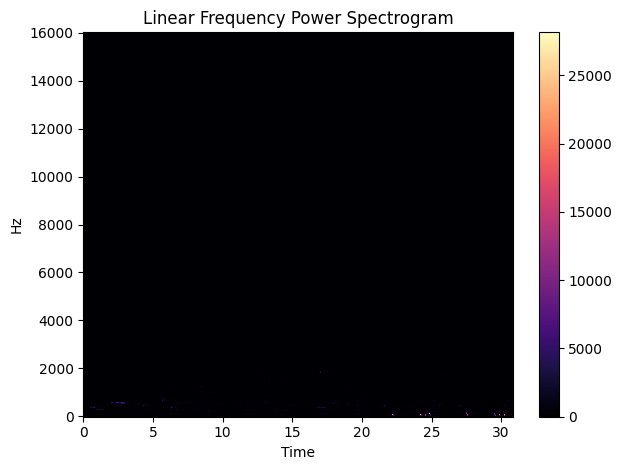

In [ ]:
librosa.display.specshow(spectrogram_librosa, sr=sr, x_axis='time', y_axis='linear',hop_length=hop_length)
plt.title('Linear Frequency Power Spectrogram')
plt.colorbar()
plt.tight_layout()
plt.show()

spectrogram in Hz (linear)

log spectrogram via MEL in dB

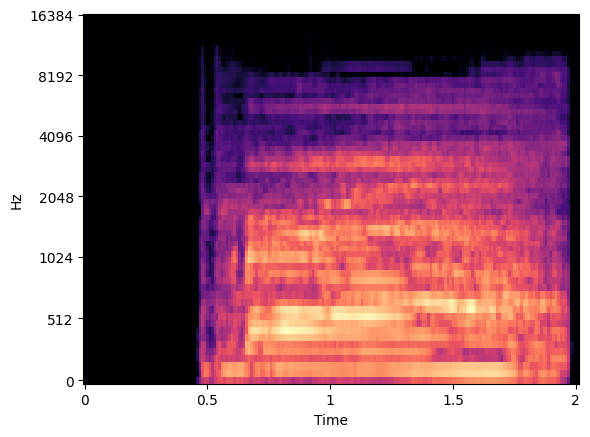

In [ ]:
##### TO SAVE THE PLOT #####
# METHOD 1
fig = plt.Figure(figsize=(8,8), dpi=128, frameon=False)
canvas = FigureCanvas(fig)
ax = fig.add_subplot(111)
ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)
ax.set_frame_on(False)
librosa.display.specshow(mel_spectrogram_db, sr=sr, x_axis='time', y_axis='mel',hop_length=hop_length)
fig.savefig('./'+str(1)+'.png', bbox_inches='tight', pad_inches=0, dpi=128)

In [ ]:
# METHOD 2
def scale_minmax(X, min=0.0, max=1.0):
    X_std = (X - X.min()) / (X.max() - X.min())
    X_scaled = X_std * (max - min) + min
    return X_scaled

def spectrogram_image(mel_spectrogram_db, out):

    # min-max scale to fit inside 8-bit range
    img = scale_minmax(mel_spectrogram_db , 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    # save as PNG
    skimage.io.imsave(out, img)


In [ ]:
#### save as .npy
with open('logMel.npy', 'wb') as f:
    np.save(f,mel_spectrogram_db)

# Load the saved data as a confirmation
with open('logMel.npy', 'rb') as f:
    a = np.load(f)
    print(a.shape)
    print(a)

####save as a.txt file
np.savetxt('logMel.csv', mel_spectrogram_db, delimiter=',') # takes more space compared to saving as .npy

(64, 202)
[[-80. -80. -80. ... -80. -80. -80.]
 [-80. -80. -80. ... -80. -80. -80.]
 [-80. -80. -80. ... -80. -80. -80.]
 ...
 [-80. -80. -80. ... -80. -80. -80.]
 [-80. -80. -80. ... -80. -80. -80.]
 [-80. -80. -80. ... -80. -80. -80.]]


sample rate: no of data samples per second sr:32000

saved the spectroogram data in txt and png files for training

The shape of the mel filter bank is:  (64, 513)


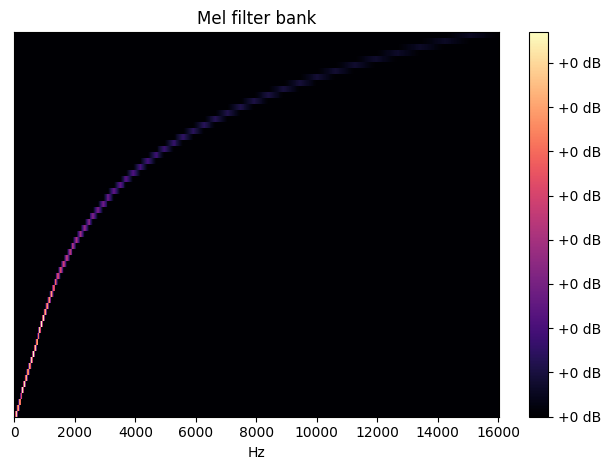

In [ ]:
mel_filter_bank = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=mel_bins, fmin=0.0, fmax=None, htk=False, norm='slaney')
print("The shape of the mel filter bank is: ", mel_filter_bank.shape)
librosa.display.specshow(mel_filter_bank, sr=sr, x_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel filter bank')
plt.tight_layout()
plt.show()

mel filter transforms the scale into something similar to human hearing which is somewhat logarithmic scale(the reason why dB: log of intensity works so well irl)

MFCC COEFFICIENT: extracting the top 13 mel frequency cepstral coeffi ients

In [ ]:
S=librosa.feature.melspectrogram(y=y,sr=sr)
log_S=librosa.power_to_db(S,ref=np.max)
mfcc=librosa.feature.mfcc(S=log_S,n_mfcc=13)

CHROMAGRAM:
Chromagram tells us the intensity of each of the 12 notes at a specific point in time.

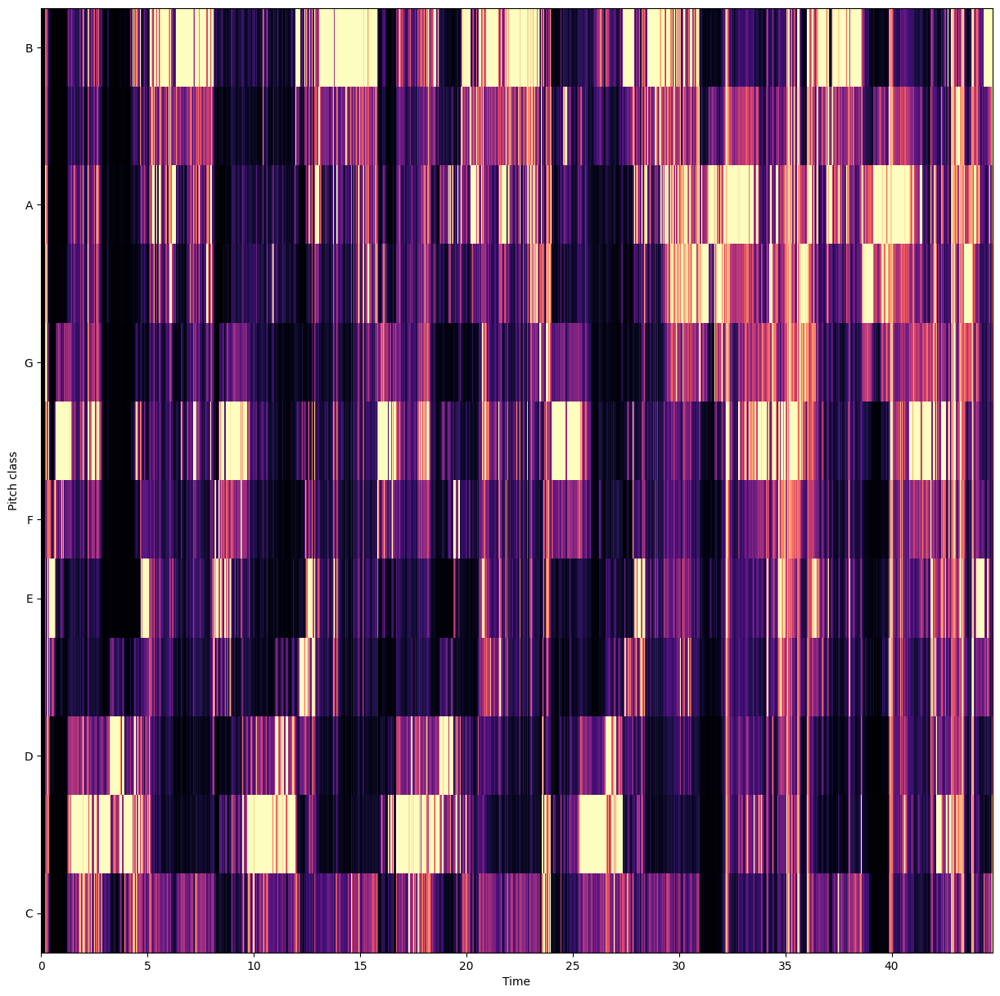

In [ ]:
chromagram=librosa.feature.chroma_stft(y=y,sr=sr)
plt.figure(figsize=(15,15))
librosa.display.specshow(chromagram,x_axis='time',y_axis='chroma')

TEMPO:
Librosa’s tempo estimates the beats per minute (BPM) of the audio clip.

In [ ]:
iitk_ka_tempo=librosa.onset.onset_strength(y=y,sr=sr)
tempo=librosa.beat.tempo(y=iitk_ka_tempo,sr=sr)
print(tempo)

[120.96774194]


<ipython-input-45-58c2abc0bfdf>:2: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo=librosa.beat.tempo(y=iitk_ka_tempo,sr=sr)


array([135.9917763])

BEATS:
Beats are extracted in 3 stages, as explained on the Librosa document:

“Measure onset strength -> Estimate tempo from onset correlation -> Pick peaks in onset strength approximately consistent with estimated tempo”

In [ ]:
y_harmonic,y_percussive=librosa.effects.hpss(y)
tempo,beats=librosa.beat.beat_track(y=y_percussive,sr=sr)

/////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////

EXTRACTING VOCALS FROM AUDIO

In [ ]:
board = Pedalboard()
cps = Compressor(threshold_db=-50, ratio=25)
gn = Gain(gain_db=30)

board.append(cps)
board.append(gn)

In [ ]:
y, sr = librosa.load('/content/untilifoundyousurge.mp3')
S_full, phase = librosa.magphase(librosa.stft(y)) # compute the spectrogram magnitude and phase
# ipd.Audio(data=y[100*sr:130*sr], rate=sr) # Play the full song with(0*sr:4000*sr) but this is a 20 sec song in the middle with these calculations

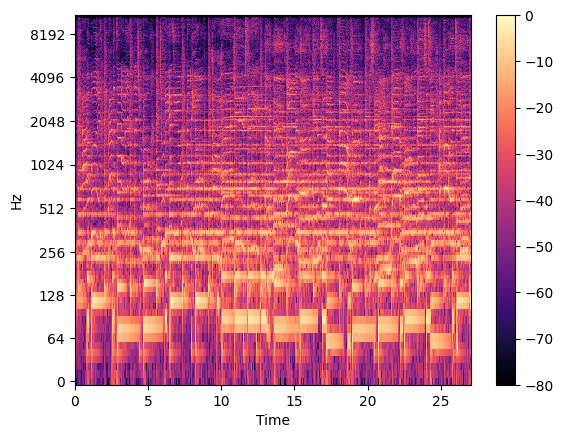

In [ ]:
idx = slice(*librosa.time_to_frames([100*130], sr=sr)) # Plot the spectrum
fig, ax = plt.subplots()
img = display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max), y_axis='log', x_axis='time', sr=sr, ax=ax)
# The wiggly lines below are due to the vocal component. Our goal is to separate them from the accompanying instrumentation.
fig.colorbar(img, ax=ax)

In [ ]:
# We'll compare frames using cosine similarity, and aggregate similar frames
# by taking their (per-frequency) median value.
#
# To avoid being biased by local continuity, we constrain similar frames to be
# separated by at least 2 seconds.
#
# This suppresses sparse/non-repetetitive deviations from the average spectrum,
# and works well to discard vocal elements.
S_filter = librosa.decompose.nn_filter(S_full, aggregate=np.median, metric='cosine', width=int(librosa.time_to_frames(2, sr=sr)))
# The output of the filter shouldn't be greater than the input
# if we assume signals are additive.  Taking the pointwise minimum
# with the input spectrum forces this.
S_filter = np.minimum(S_full, S_filter) # minimum

In [ ]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation
margin_i, margin_v = 3, 11  # can be changed to reduce bleeds
power = 3

mask_i = librosa.util.softmask(S_filter, margin_i * (S_full - S_filter), power=power)
mask_v = librosa.util.softmask(S_full - S_filter, margin_v * S_filter, power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

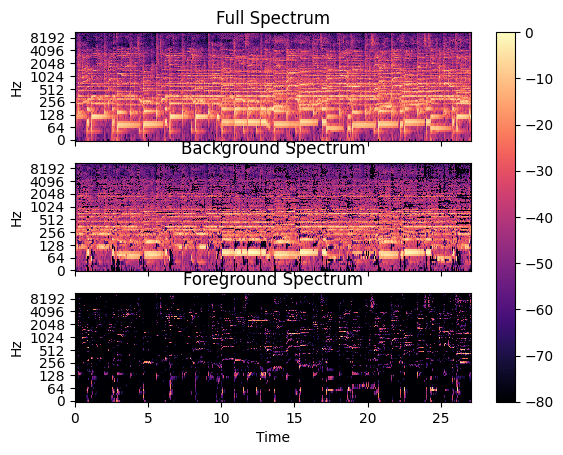

In [ ]:
# Plot the same slice, but separated into its foreground and background
fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True)
img = display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max), y_axis='log', x_axis='time', sr=sr, ax=ax[0])
ax[0].set(title='Full Spectrum')
ax[0].label_outer()

display.specshow(librosa.amplitude_to_db(S_background[:, idx], ref=np.max), y_axis='log', x_axis='time', sr=sr, ax=ax[1])
ax[1].set(title='Background Spectrum')
ax[1].label_outer()

display.specshow(librosa.amplitude_to_db(S_foreground[:, idx], ref=np.max), y_axis='log', x_axis='time', sr=sr, ax=ax[2])
ax[2].set(title='Foreground Spectrum')
ax[2].label_outer()

fig.colorbar(img, ax=ax)

In [ ]:
# Recover the foreground audio from the masked spectrogram
y_foreground = librosa.istft(S_foreground * phase)
sf.write('Vocals.wav', y_foreground, sr, subtype="PCM_24")
# playback audio
ipd.Audio(data=y_foreground, rate=sr)
##########################################################################################################

In [ ]:
# Read audio
data, samplerate = sf.read('Vocals.wav')
# reduce noise
y_reduced_noise = nr.reduce_noise(y=data, sr=samplerate)
# save audio
sf.write('Vocals_reduced.wav', y_reduced_noise, samplerate, subtype="PCM_24")
# load and play audio
data, samplerate = librosa.load('Vocals_reduced.wav')
ipd.Audio('Vocals_reduced.wav')

In [ ]:
# Recover the background audio from the masked spectrogram
x_background = librosa.istft(S_background * phase)
# save instrument track and play
sf.write('Instruments.wav', x_background, sr, subtype="PCM_24")
y, sr = librosa.load('Instruments.wav')
ipd.Audio('Instruments.wav')


In [ ]:
compressed_vocals = board(y, sr)
ipd.Audio('Vocals.wav')

THANK YOU